# Jayesh Patil

Exploratory Data Analysis

In [ ]:
# STEP 1: Import Required Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# STEP 2: Load the Data
from google.colab import files
uploaded = files.upload()

# Read the uploaded file
df = pd.read_csv(next(iter(uploaded)), encoding='ISO-8859-1')

Saving Crash_Reporting_-_Drivers_Data.csv to Crash_Reporting_-_Drivers_Data.csv


<ipython-input-2-591fc78ee461>:12: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(next(iter(uploaded)), encoding='ISO-8859-1')


In [ ]:
# STEP 3: Quick Overview
print("Shape of dataset:", df.shape)
print("\nData types:\n", df.dtypes)
print("\nMissing values:\n", df.isnull().sum().sort_values(ascending=False).head(10))
print("\nUnique values per column:\n", df.nunique().sort_values())


Shape of dataset: (195092, 39)

Data types:
 Report Number                     object
Local Case Number                 object
Agency Name                       object
ACRS Report Type                  object
Crash Date/Time                   object
Route Type                        object
Road Name                         object
Cross-Street Name                 object
Off-Road Description              object
Municipality                      object
Related Non-Motorist              object
Collision Type                    object
Weather                           object
Surface Condition                 object
Light                             object
Traffic Control                   object
Driver Substance Abuse            object
Non-Motorist Substance Abuse      object
Person ID                         object
Driver At Fault                   object
Injury Severity                   object
Circumstance                      object
Driver Distracted By              object
Drivers Lice

In [ ]:
# Select numeric columns for outlier analysis
numeric_cols = ['Speed Limit', 'Vehicle Year', 'Latitude', 'Longitude']

# Function to detect and remove outliers using IQR
def remove_outliers_iqr(df, cols):
    df_out = df.copy()
    for col in cols:
        Q1 = df_out[col].quantile(0.25)
        Q3 = df_out[col].quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Filtering out the outliers
        df_out = df_out[(df_out[col] >= lower_bound) & (df_out[col] <= upper_bound)]

        print(f'{col}: Removed outliers outside the range [{lower_bound}, {upper_bound}]')
    return df_out

In [ ]:
# Remove outliers and display result
df_clean = remove_outliers_iqr(df, numeric_cols)

# Summary before and after
print(f'Original Data Shape: {df.shape}')
print(f'Data Shape after Outlier Removal: {df_clean.shape}')

Speed Limit: Removed outliers outside the range [2.5, 62.5]
Vehicle Year: Removed outliers outside the range [1991.0, 2031.0]
Latitude: Removed outliers outside the range [38.852026727500004, 39.31258126750001]
Longitude: Removed outliers outside the range [-77.41265081999998, -76.81580418000001]
Original Data Shape: (195092, 39)
Data Shape after Outlier Removal: (182237, 39)


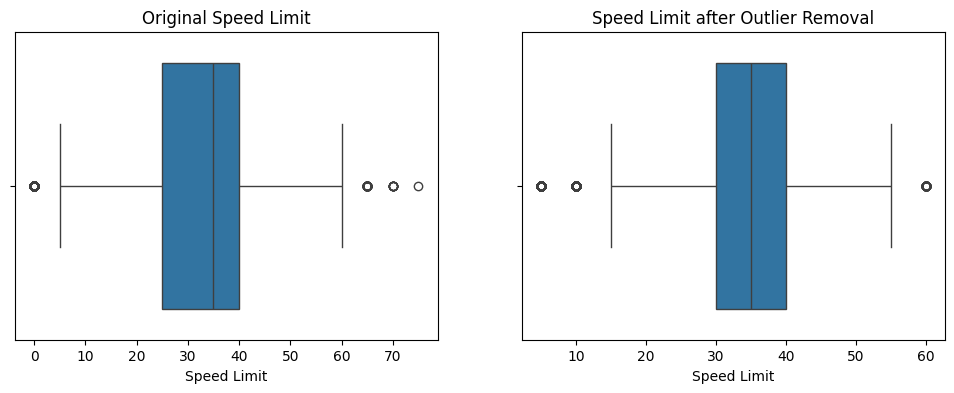

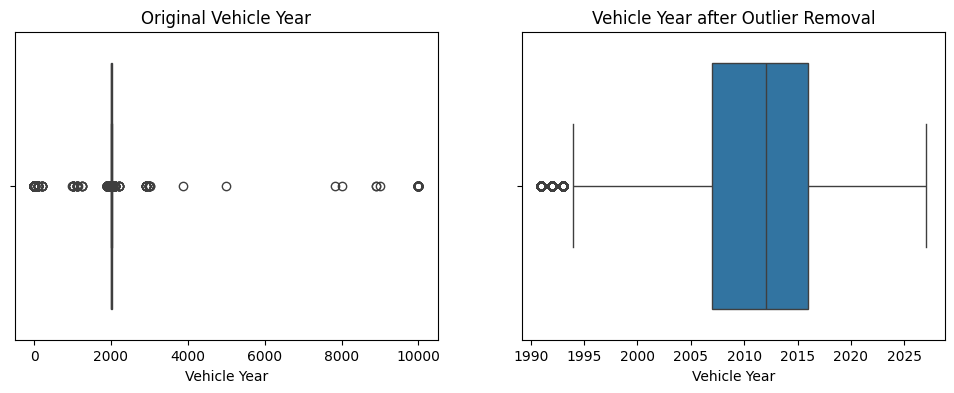

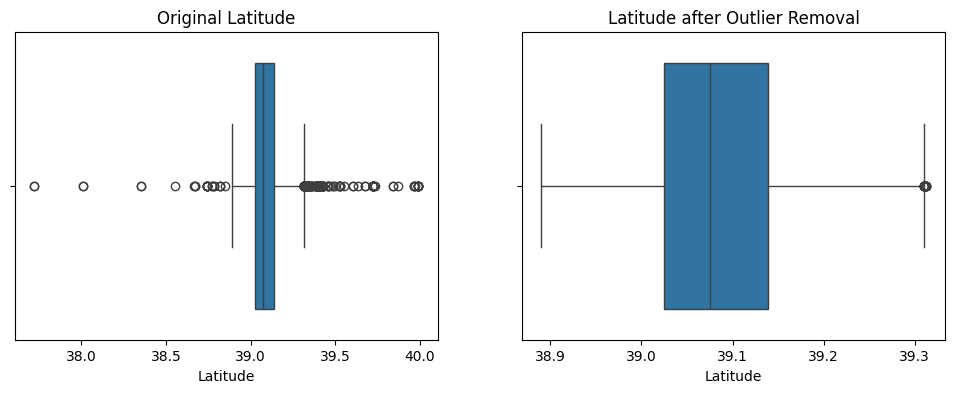

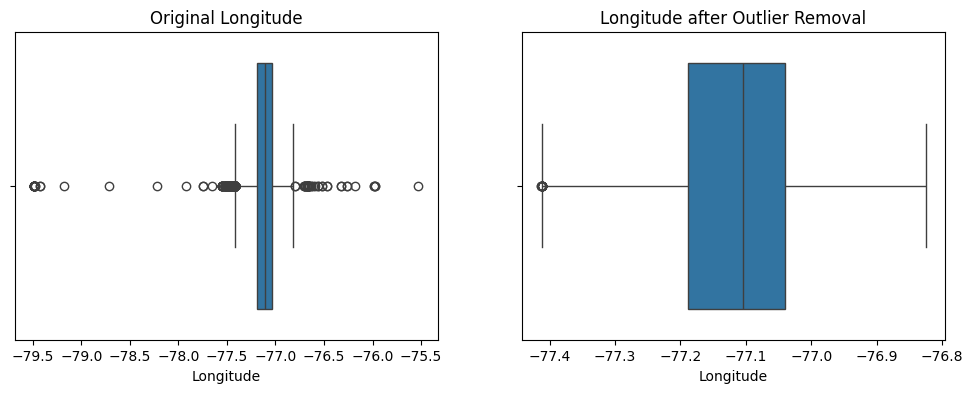

In [ ]:
# Visualize before-and-after effect using boxplots
for col in numeric_cols:
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 2, 1)
    sns.boxplot(x=df[col])
    plt.title(f'Original {col}')

    plt.subplot(1, 2, 2)
    sns.boxplot(x=df_clean[col])
    plt.title(f'{col} after Outlier Removal')

    plt.show()

In [ ]:
# Crash Frequency by Hour of Day and Weather Conditions

<ipython-input-8-d57e6cc833df>:9: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_clean['Crash Date/Time'] = pd.to_datetime(df_clean['Crash Date/Time'], errors='coerce')


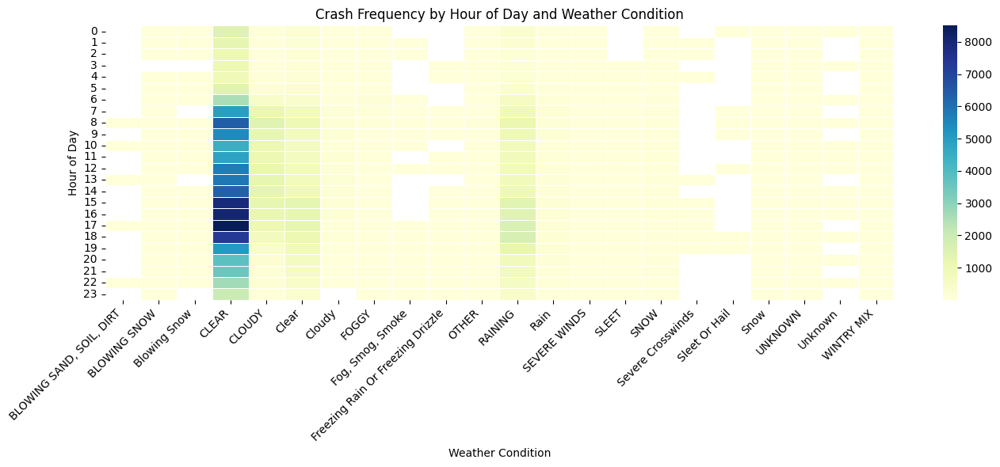

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Select relevant columns and drop rows with missing values in those
df_clean = df[['Crash Date/Time', 'Weather', 'Light', 'Surface Condition', 'Injury Severity', 'Speed Limit']]
df_clean = df_clean.dropna()

# Convert Crash Date/Time to datetime
df_clean['Crash Date/Time'] = pd.to_datetime(df_clean['Crash Date/Time'], errors='coerce')
df_clean = df_clean.dropna(subset=['Crash Date/Time'])

# Extract hour from Crash Date/Time
df_clean['Hour'] = df_clean['Crash Date/Time'].dt.hour

# Plot: Heatmap showing frequency of crashes by Hour of Day and Weather
pivot_table = pd.pivot_table(df_clean, index='Hour', columns='Weather', values='Injury Severity', aggfunc='count')

plt.figure(figsize=(14, 6))
sns.heatmap(pivot_table, cmap='YlGnBu', linewidths=.5)

plt.title('Crash Frequency by Hour of Day and Weather Condition')
plt.ylabel('Hour of Day')
plt.xlabel('Weather Condition')

# Formatting X and Y axis
plt.yticks(rotation=0)  # Keep hour labels horizontal
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

MODELS

1) SUPPORT VECTOR MACHINE (SVM)

Q. "Can we accurately predict whether a crash will result in an injury based on environmental conditions, vehicle details, and driver behavior?"

In [ ]:
# Step 1: Install and import libraries
!pip install scikit-learn pandas matplotlib seaborn

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix


In [ ]:
# Step 3: Drop rows with missing values in important columns
features = ['Speed Limit', 'Weather', 'Light', 'Driver Distracted By', 'Vehicle Year']
df = df[features + ['Injury Severity']].dropna()

# Step 4: Encode categorical variables
for col in ['Weather', 'Light', 'Driver Distracted By', 'Injury Severity']:
    df[col] = LabelEncoder().fit_transform(df[col])

In [ ]:
# Step 5: Split into X and y
X = df.drop('Injury Severity', axis=1)
y = df['Injury Severity']

# Step 6: Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 7: Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
# Step 8: Train SVM
model = SVC(kernel='rbf', C=1, gamma='scale')
model.fit(X_train_scaled, y_train)

# Step 9: EvaluateFrom the
y_pred = model.predict(X_test_scaled)
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))


Confusion Matrix:
 [[    0     0    39     0     0     0     0     0     0     0]
 [    0     0     0     4     0     0     0     0     0     0]
 [    0     0 25785     0     0     0     0     0     0     0]
 [    0     0    19  3568     0     0     0     0     0     0]
 [    0     0  3250     1     0     0     0     0     0     0]
 [    0     0     0   291     0     0     0     0     0     0]
 [    0     0  2174     0     0     0     0     0     0     0]
 [    0     0   264     0     0     0     0     0     0     0]
 [    0     0     2   366     0     0     0     0     0     0]
 [    0     0     0    38     0     0     0     0     0     0]]

Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        39
           1       0.00      0.00      0.00         4
           2       0.82      1.00      0.90     25785
           3       0.84      0.99      0.91      3587
           4       0.00      0.00      0.00      3251


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


2) K-means CLUSTERING

Q. How can we segment vehicle-involved crashes into distinct clusters based on driving conditions and vehicle characteristics to inform targeted road safety interventions?

In [ ]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# Upload data
from google.colab import files
uploaded = files.upload()
df = pd.read_csv(next(iter(uploaded)), encoding='ISO-8859-1')

# Select relevant features + location
cols = ['Speed Limit', 'Vehicle Year', 'Weather', 'Surface Condition',
        'Driver Substance Abuse', 'Latitude', 'Longitude']
df_cluster = df[cols].dropna()

# Encode categorical
for col in ['Weather', 'Surface Condition', 'Driver Substance Abuse']:
    df_cluster[col] = LabelEncoder().fit_transform(df_cluster[col].astype(str))

# Keep original for mapping later
df_original = df_cluster.copy()

# Scale for clustering
features = ['Speed Limit', 'Vehicle Year', 'Weather', 'Surface Condition', 'Driver Substance Abuse']
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_cluster[features])




Saving Crash_Reporting_-_Drivers_Data.csv to Crash_Reporting_-_Drivers_Data.csv


<ipython-input-3-0882845b382b>:12: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(next(iter(uploaded)), encoding='ISO-8859-1')


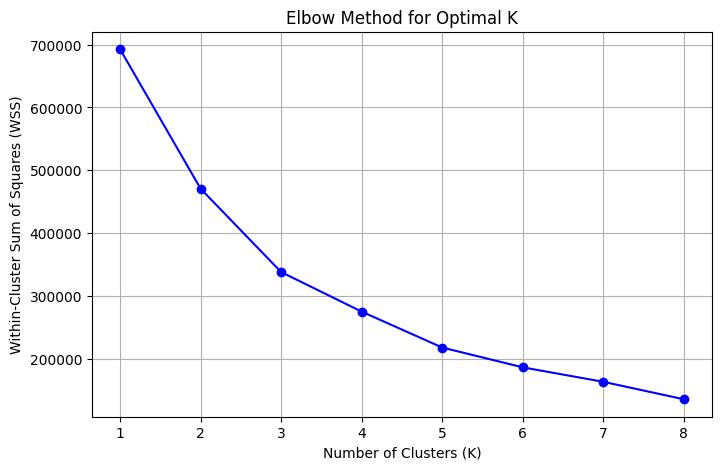

In [ ]:
# Step 4: Elbow Method to find optimal K
wss = []
K_range = range(1, 9)
for k in K_range:
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=123)
    kmeans.fit(scaled_data)
    wss.append(kmeans.inertia_)

# Plot Elbow Curve
plt.figure(figsize=(8, 5))
plt.plot(K_range, wss, 'bo-', markersize=6)
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Within-Cluster Sum of Squares (WSS)')
plt.title('Elbow Method for Optimal K')
plt.grid(True)
plt.show()

# KMeans Clustering
kmeans = KMeans(n_clusters=3, n_init=25, random_state=123)
df_original['Cluster'] = kmeans.fit_predict(scaled_data)

In [ ]:
# 1. 3D Plot

df_original['Injury Severity'] = df['Injury Severity']
fig_3d = px.scatter_3d(df_original,
                       x='Speed Limit',
                       y='Vehicle Year',
                       z='Injury Severity',
                       color=df_original['Cluster'].astype(str),
                       title='3D Cluster Visualization: Speed Limit vs Vehicle Year vs Injury Severity',
                       hover_data=features,
                       template='plotly_dark')
fig_3d.update_traces(marker=dict(size=4))
fig_3d.show()



In [ ]:
# 2. Geo-Cluster Map

fig_map = px.scatter_mapbox(df_original, lat="Latitude", lon="Longitude", color=df_original['Cluster'].astype(str),
                            zoom=9, mapbox_style="carto-darkmatter",
                            title="Crash Clusters by Location",
                            hover_data=features)
fig_map.update_layout(height=600)
fig_map.show()

In [ ]:
# 3. Cluster Profile Summary

profile = df_original.groupby("Cluster")[features].agg(['mean', 'median', 'std', 'min', 'max']).round(2)
import pandas.io.formats.style
import seaborn as sns
from IPython.display import display
display(profile)

Speed Limit                      Vehicle Year                        \
               mean median   std min max         mean  median     std   min   
Cluster                                                                       
0             32.77   35.0  8.62   0  70         4.75     0.0   64.14     0   
1             34.75   35.0  8.08   0  75      2014.08  2012.0  144.12  1008   
2             35.03   35.0  8.14   0  70      2012.14  2011.0  109.15  1014   

               ... Surface Condition                       \
          max  ...              mean median   std min max   
Cluster        ...                                          
0        1111  ...              3.63    0.0  7.00   0  20   
1        9999  ...              0.20    0.0  0.76   0  18   
2        9999  ...             17.71   18.0  2.60   0  20   

        Driver Substance Abuse                       
                          mean median   std min max  
Cluster                                              
0                        16.15   16.0  2.14   0  19  
1                         8.36    8.0  2.40   0  19  
2                         8.31    8.0  2.29   0  19  

[3 rows x 25 columns]

# Yuchen He

In [ ]:
!pip install mlxtend

In [ ]:
# Select only the 8 variables we are using for analysis
cols_keep = [
    "Driver At Fault", "Weather", "Light", "Collision Type",
    "Driver Distracted By", "Speed Limit",
    "Vehicle Body Type", "Vehicle Year"
]
crash = crash_raw[cols_keep]
crash.head()


,Driver At Fault,Weather,Light,Collision Type,Driver Distracted By,Speed Limit,Vehicle Body Type,Vehicle Year
0,No,CLEAR,DAYLIGHT,OTHER,UNKNOWN,0.0,OTHER,2017.0
1,Yes,CLEAR,DAYLIGHT,OTHER,UNKNOWN,5.0,PASSENGER CAR,2012.0
2,Yes,CLEAR,DAYLIGHT,OTHER,NOT DISTRACTED,15.0,PASSENGER CAR,2015.0
3,Unknown,CLEAR,DAYLIGHT,SINGLE VEHICLE,UNKNOWN,15.0,PASSENGER CAR,2018.0
4,No,CLEAR,DARK LIGHTS ON,STRAIGHT MOVEMENT ANGLE,NOT DISTRACTED,35.0,PASSENGER CAR,2017.0


In [ ]:
# Remove rows where Driver At Fault is 'Unknown' or missing
import numpy as np
crash_nb = crash[~crash["Driver At Fault"].isin(["Unknown"])]
crash_nb = crash_nb.dropna(subset=["Driver At Fault"])
crash_nb["Driver At Fault"] = crash_nb["Driver At Fault"].astype("category")

for col in crash_nb.columns:
    if col == "Driver At Fault":
        continue
    if crash_nb[col].dtype in [np.float64, np.int64]:
        crash_nb[col] = crash_nb[col].fillna(crash_nb[col].median())
    else:
        crash_nb[col] = crash_nb[col].fillna("Missing").astype("category")


In [ ]:
# Import necessary Python libraries for data processing, model training, and evaluation
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder
from sklearn.naive_bayes import CategoricalNB
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np

# Step 1: Split the raw data
# Separate features (X) from the target variable (y)
# Perform stratified train-test split to maintain class distribution
X_raw = crash_nb.drop("Driver At Fault", axis=1)
y = crash_nb["Driver At Fault"]
X_train_raw, X_test_raw, y_train, y_test = train_test_split(
    X_raw, y, test_size=0.3, stratify=y, random_state=42
)

# Step 2: Ordinal encoding for categorical features
# Convert all categorical variables to numeric values using OrdinalEncoder
# Handle unseen categories in the test set by encoding them as -1
encoder = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)
X_train = encoder.fit_transform(X_train_raw)
X_test = encoder.transform(X_test_raw)

# Step 3: Clip -1 in test set to max category value in training set
# by clipping them to the max known category index from training data
def fix_negatives(test_array, train_array):
    X_fixed = test_array.copy()
    for col in range(X_fixed.shape[1]):
        max_val = train_array[:, col].max()
        X_fixed[:, col][X_fixed[:, col] < 0] = max_val
    return X_fixed

X_test = fix_negatives(X_test, X_train)


# Step 4: Train and evaluate Naive Bayes
nb = CategoricalNB()
nb.fit(X_train, y_train)
y_pred = nb.predict(X_test)

# Output evaluation
print("🔹 Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

print("\n🔹 Classification Report:")
print(classification_report(y_test, y_pred))


🔹 Confusion Matrix:
[[6596  751]
 [2344 6695]]

🔹 Classification Report:
              precision    recall  f1-score   support

          No       0.74      0.90      0.81      7347
         Yes       0.90      0.74      0.81      9039

    accuracy                           0.81     16386
   macro avg       0.82      0.82      0.81     16386
weighted avg       0.83      0.81      0.81     16386



Naive Bayes Model

In [ ]:
# Import pandas for data manipulation and CSV operations
import pandas as pd
# Export classification report to CSV
# Convert the classification report (precision, recall, F1-score) to a DataFrame
# and save it as a CSV file for documentation
report_df = pd.DataFrame(classification_report(y_test, y_pred, output_dict=True))
report_df.to_csv("naive_bayes_report.csv")
# Export confusion matrix to CSV
# Create a DataFrame from the confusion matrix and save it for reporting/plotting
conf_matrix_df = pd.DataFrame(confusion_matrix(y_test, y_pred))
conf_matrix_df.to_csv("naive_bayes_confusion_matrix.csv", index=False)


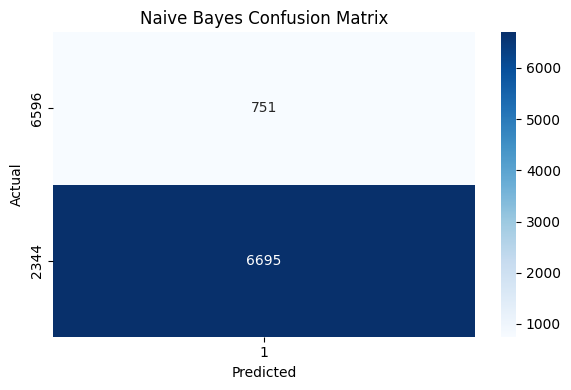

Text(0.5, 1.0, 'Naive Bayes Confusion Matrix')

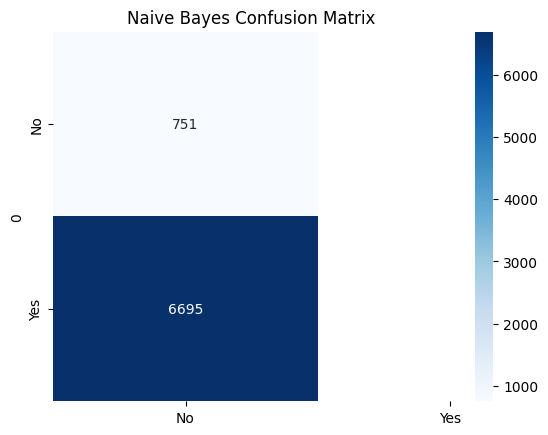

In [ ]:
# Load the saved confusion matrix from CSV
matrix_df = pd.read_csv("naive_bayes_confusion_matrix.csv", index_col=0)

# Plot confusion matrix as a heatmap
# This gives a visual summary of the classification performance
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(6, 4))
sns.heatmap(matrix_df, annot=True, fmt='g', cmap='Blues')
plt.title("Naive Bayes Confusion Matrix")
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.tight_layout()
plt.show()

#Another version of the heatmap with axis labels for 'Yes' and 'No'
fig, ax = plt.subplots()
sns.heatmap(matrix_df, annot=True, fmt='g', cmap='Blues',
            xticklabels=['No', 'Yes'], yticklabels=['No', 'Yes'], ax=ax)
plt.title("Naive Bayes Confusion Matrix")



Principal Component Analysis

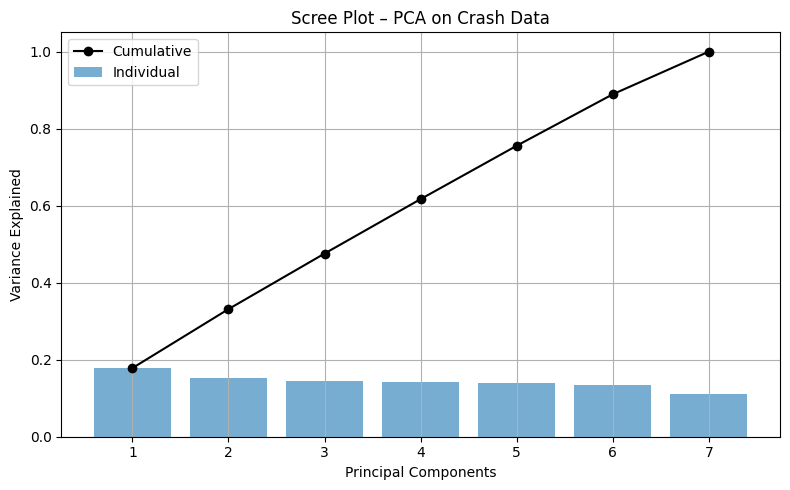

In [ ]:
# Import necessary libraries for PCA and plotting
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np
# Scale data without centering (set with_mean=False to avoid centering sparse data)
# StandardScaler is used to standardize features by removing the mean and scaling to unit variance
# Encode categorical features (example)
from sklearn.preprocessing import OrdinalEncoder
encoder = OrdinalEncoder()
X_encoded = encoder.fit_transform(X_raw)  # This must come before StandardScaler
# Scale data without centering to preserve sparse structure
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler(with_mean=False)
X_scaled = scaler.fit_transform(X_encoded)

# Apply PCA
from sklearn.decomposition import PCA
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Apply PCA (Principal Component Analysis) on the scaled dataset
# PCA helps reduce the dimensionality of the data while preserving variance
pca = PCA()
X_pca = pca.fit_transform(X_scaled)
# Apply PCA (Principal Component Analysis) on the scaled dataset
# PCA helps reduce the dimensionality of the data while preserving variance
pca = PCA()
X_pca = pca.fit_transform(X_scaled)
# Create a scree plot to visualize explained variance by each principal component
# The bar shows individual variance and the line shows cumulative variance
plt.figure(figsize=(8, 5))
plt.bar(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_, alpha=0.6, label='Individual')
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), np.cumsum(pca.explained_variance_ratio_), marker='o', color='black', label='Cumulative')
plt.title("Scree Plot – PCA on Crash Data")
plt.xlabel("Principal Components")
plt.ylabel("Variance Explained")
plt.xticks(range(1, len(pca.explained_variance_ratio_) + 1))
plt.legend(loc='best')
plt.grid(True)
plt.tight_layout()
plt.show()



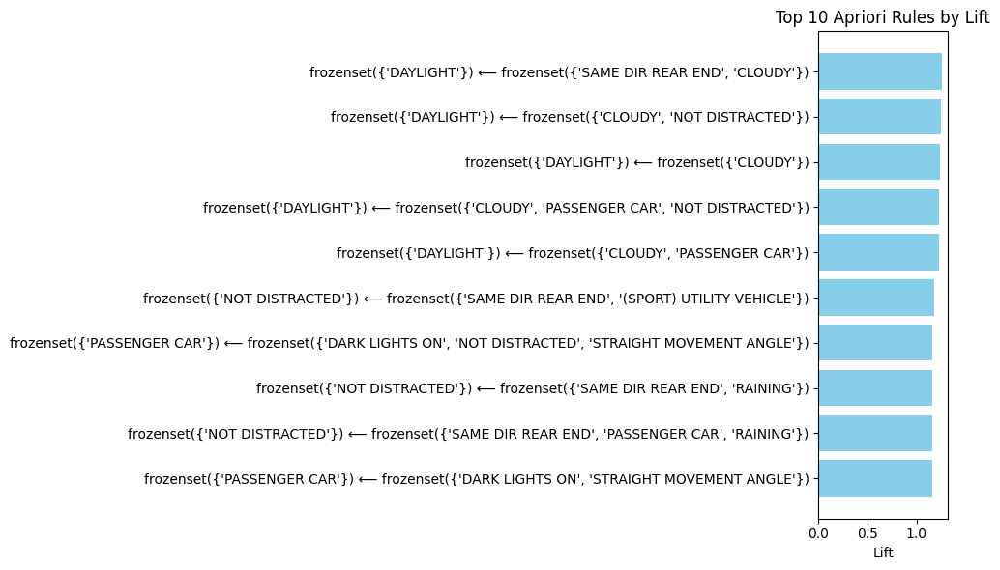

In [ ]:
# Import Apriori algorithm and association rule mining functions from mlxtend
from mlxtend.frequent_patterns import apriori, association_rules
# Import TransactionEncoder to convert the data into transaction format
from mlxtend.preprocessing import TransactionEncoder

# Choose relevant categorical columns for association rule mining
# These are the features with high cardinality that describe crash circumstances
apriori_cols = [
    'Weather', 'Light', 'Collision Type',
    'Driver Distracted By', 'Vehicle Body Type'
]

# Convert the selected columns into a list-of-lists format (transactions)
# Each row becomes a list of categorical attribute values
transactions = crash_nb[apriori_cols].astype(str).values.tolist()

# Use TransactionEncoder to one-hot encode the transactions
te = TransactionEncoder()
te_ary = te.fit(transactions).transform(transactions)
df_trans = pd.DataFrame(te_ary, columns=te.columns_)

# Apply the Apriori algorithm to find frequent itemsets with minimum support of 2%
frequent_itemsets = apriori(df_trans, min_support=0.02, use_colnames=True)

# Generate association rules from the frequent itemsets with confidence ≥ 60%
rules = association_rules(frequent_itemsets, metric='confidence', min_threshold=0.6)

# Save the rules to a CSV file for later analysis or visualization
rules.to_csv("apriori_rules.csv", index=False)

# Load libraries for visualization
import pandas as pd
import matplotlib.pyplot as plt


# Load the saved rules from CSV
rules = pd.read_csv("apriori_rules.csv")

# Sort rules by lift and select the top 10 strongest patterns
top_rules = rules.sort_values('lift', ascending=False).head(10)

# Create a bar chart to visualize the top 10 rules by lift
plt.figure(figsize=(10, 6))
plt.barh(range(len(top_rules)), top_rules['lift'], color='skyblue')
plt.yticks(
    range(len(top_rules)),
    top_rules['consequents'] + " ⟵ " + top_rules['antecedents']
)
plt.xlabel("Lift")
plt.title("Top 10 Apriori Rules by Lift")
plt.gca().invert_yaxis()  # Highest lift on top
plt.tight_layout()
plt.show()


In [ ]:
# STEP 1: Import libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, classification_report
from imblearn.over_sampling import SMOTE
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from sklearn.neural_network import MLPClassifier

# STEP 2: Load and preprocess
df = pd.read_csv("C:/Users/hp/Downloads/Crash_Reporting_-_Drivers_Data.csv", usecols=[
    'Crash Date/Time', 'Injury Severity', 'Speed Limit', 'Vehicle Year',
    'Latitude', 'Longitude', 'Weather', 'Light', 'Collision Type', 'Driver At Fault'
])

# Parse datetime
df['Crash Date/Time'] = pd.to_datetime(df['Crash Date/Time'], errors='coerce')
df = df.dropna(subset=['Crash Date/Time'])

# Separate prediction target and drop missing
to_predict_later = df[df['Injury Severity'].isna()].copy()
df_train = df.dropna(subset=['Injury Severity']).copy()

# Encode target
le = LabelEncoder()
df_train['Injury Severity Encoded'] = le.fit_transform(df_train['Injury Severity'])

# STEP 3: Feature engineering
df_train['Crash_Hour'] = df_train['Crash Date/Time'].dt.hour
df_train['Crash_DayOfWeek'] = df_train['Crash Date/Time'].dt.dayofweek
df_train['Vehicle_Age'] = 2025 - df_train['Vehicle Year']
df_train['Speed_per_Year'] = df_train['Speed Limit'] / df_train['Vehicle Year']

# STEP 4: Fill and encode categoricals
categorical_cols = ['Weather', 'Light', 'Collision Type', 'Driver At Fault']
df_train[categorical_cols] = df_train[categorical_cols].fillna('Unknown')
df_encoded = pd.get_dummies(df_train[categorical_cols], drop_first=True)

# Merge all features
numeric_cols = ['Speed Limit', 'Vehicle Year', 'Latitude', 'Longitude',
                'Crash_Hour', 'Crash_DayOfWeek', 'Vehicle_Age', 'Speed_per_Year']
X = pd.concat([df_train[numeric_cols], df_encoded], axis=1).fillna(0)
y = df_train['Injury Severity Encoded']

# STEP 5: Outlier handling
def replace_outliers_with_median(df, columns):
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - 1.5 * IQR
        upper = Q3 + 1.5 * IQR
        median = df[col].median()
        df[col] = np.where((df[col] < lower) | (df[col] > upper), median, df[col])
    return df

X = replace_outliers_with_median(X, numeric_cols)

# STEP 6: Scale numeric features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# STEP 7: Train-test split + SMOTE
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)
smote = SMOTE(random_state=42)
X_train_bal, y_train_bal = smote.fit_resample(X_train, y_train)

# ================================
# MODEL 1: CatBoost Classifier
# ================================
cat_model = CatBoostClassifier(verbose=0)
cat_model.fit(X_train_bal, y_train_bal)
cat_preds = cat_model.predict(X_test)
cat_acc = accuracy_score(y_test, cat_preds)

# ================================
# MODEL 2: LightGBM Classifier
# ================================
lgb_model = LGBMClassifier()
lgb_model.fit(X_train_bal, y_train_bal)
lgb_preds = lgb_model.predict(X_test)
lgb_acc = accuracy_score(y_test, lgb_preds)

# ================================
# MODEL 3: MLP Classifier (Neural Net)
# ================================
mlp_model = MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42)
mlp_model.fit(X_train_bal, y_train_bal)
mlp_preds = mlp_model.predict(X_test)
mlp_acc = accuracy_score(y_test, mlp_preds)

# ================================
# Evaluation
# ================================
print(f"\n✅ CatBoost Accuracy: {round(cat_acc * 100, 2)}%")
print(f"✅ LightGBM Accuracy: {round(lgb_acc * 100, 2)}%")
print(f"✅ MLPClassifier Accuracy: {round(mlp_acc * 100, 2)}%")

best_model = max([cat_acc, lgb_acc, mlp_acc])
if best_model > 0.9:
    print("🎯 Goal Achieved: Accuracy > 90%")
else:
    print("🔁 Consider feature tuning or ensembling for further improvement.")


ModuleNotFoundError: No module named 'catboost'

In [ ]:
!pip install catboost

     ------------------------------------- 102.5/102.5 MB 10.7 MB/s eta 0:00:00
     ---------------------------------------- 47.1/47.1 kB 2.3 MB/s eta 0:00:00


In [ ]:
pip install lightgbm imbalanced-learn

     ---------------------------------------- 1.5/1.5 MB 11.5 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


# Subash Chakravarthy

In [ ]:
# STEP 1: Import libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, classification_report
from imblearn.over_sampling import SMOTE
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from sklearn.neural_network import MLPClassifier

# STEP 2: Load and preprocess
df = pd.read_csv("C:/Users/hp/Downloads/Crash_Reporting_-_Drivers_Data.csv", usecols=[
    'Crash Date/Time', 'Injury Severity', 'Speed Limit', 'Vehicle Year',
    'Latitude', 'Longitude', 'Weather', 'Light', 'Collision Type', 'Driver At Fault'
])

# Parse datetime
df['Crash Date/Time'] = pd.to_datetime(df['Crash Date/Time'], errors='coerce')
df = df.dropna(subset=['Crash Date/Time'])

# Separate prediction target and drop missing
to_predict_later = df[df['Injury Severity'].isna()].copy()
df_train = df.dropna(subset=['Injury Severity']).copy()

# Encode target
le = LabelEncoder()
df_train['Injury Severity Encoded'] = le.fit_transform(df_train['Injury Severity'])

# STEP 3: Feature engineering
df_train['Crash_Hour'] = df_train['Crash Date/Time'].dt.hour
df_train['Crash_DayOfWeek'] = df_train['Crash Date/Time'].dt.dayofweek
df_train['Vehicle_Age'] = 2025 - df_train['Vehicle Year']
df_train['Speed_per_Year'] = df_train['Speed Limit'] / df_train['Vehicle Year']

# STEP 4: Fill and encode categoricals
categorical_cols = ['Weather', 'Light', 'Collision Type', 'Driver At Fault']
df_train[categorical_cols] = df_train[categorical_cols].fillna('Unknown')
df_encoded = pd.get_dummies(df_train[categorical_cols], drop_first=True)

# Merge all features
numeric_cols = ['Speed Limit', 'Vehicle Year', 'Latitude', 'Longitude',
                'Crash_Hour', 'Crash_DayOfWeek', 'Vehicle_Age', 'Speed_per_Year']
X = pd.concat([df_train[numeric_cols], df_encoded], axis=1).fillna(0)
y = df_train['Injury Severity Encoded']

# STEP 5: Outlier handling
def replace_outliers_with_median(df, columns):
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - 1.5 * IQR
        upper = Q3 + 1.5 * IQR
        median = df[col].median()
        df[col] = np.where((df[col] < lower) | (df[col] > upper), median, df[col])
    return df

X = replace_outliers_with_median(X, numeric_cols)

# STEP 6: Scale numeric features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# STEP 7: Train-test split + SMOTE
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)
smote = SMOTE(random_state=42)
X_train_bal, y_train_bal = smote.fit_resample(X_train, y_train)

# ================================
# MODEL 1: CatBoost Classifier
# ================================
cat_model = CatBoostClassifier(verbose=0)
cat_model.fit(X_train_bal, y_train_bal)
cat_preds = cat_model.predict(X_test)
cat_acc = accuracy_score(y_test, cat_preds)

# ================================
# MODEL 2: LightGBM Classifier
# ================================
lgb_model = LGBMClassifier()
lgb_model.fit(X_train_bal, y_train_bal)
lgb_preds = lgb_model.predict(X_test)
lgb_acc = accuracy_score(y_test, lgb_preds)

# ================================
# MODEL 3: MLP Classifier (Neural Net)
# ================================
mlp_model = MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42)
mlp_model.fit(X_train_bal, y_train_bal)
mlp_preds = mlp_model.predict(X_test)
mlp_acc = accuracy_score(y_test, mlp_preds)

# ================================
# Evaluation
# ================================
print(f"\n✅ CatBoost Accuracy: {round(cat_acc * 100, 2)}%")
print(f"✅ LightGBM Accuracy: {round(lgb_acc  * 100, 2)}%")
print(f"✅ MLPClassifier Accuracy: {round(mlp_acc * 100, 2)}%")

best_model = max([cat_acc, lgb_acc, mlp_acc])
if best_model > 0.9:
    print("🎯 Goal Achieved: Accuracy > 90%")
else:
    print("🔁 Consider feature tuning or ensembling for further improvement.")

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.229206 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11278
[LightGBM] [Info] Number of data points in the train set: 988980, number of used features: 73
[LightGBM] [Info] Start training from score -2.302585
[LightGBM] [Info] Start training from score -2.302585
[LightGBM] [Info] Start training from score -2.302585
[LightGBM] [Info] Start training from score -2.302585
[LightGBM] [Info] Start training from score -2.302585
[LightGBM] [Info] Start training from score -2.302585
[LightGBM] [Info] Start training from score -2.302585
[LightGBM] [Info] Start training from score -2.302585
[LightGBM] [Info] Start training from score -2.302585
[LightGBM] [Info] Start training from score -2.302585

✅ CatBoost Accuracy: 81.66%
✅ LightGBM Accuracy: 81.54%
✅ MLPClassifier Accuracy: 54.95%
🔁 Consider feat

In [ ]:
plt.figure(figsize=(8, 5))
sns.countplot(data=df_train, x='Injury Severity', palette='viridis')
plt.title("Distribution of Injury Severity")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

NameError: name 'plt' is not defined

In [ ]:
# Step 1: Import libraries
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

In [ ]:
%matplotlib inline


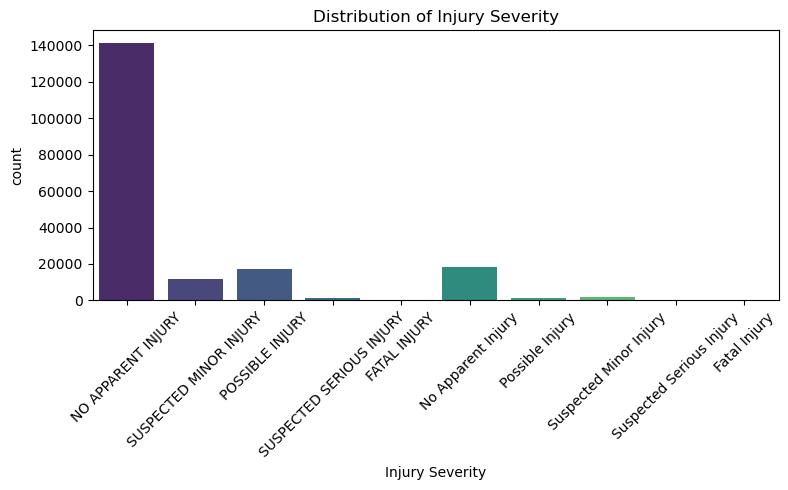

In [ ]:
plt.figure(figsize=(8, 5))
sns.countplot(data=df_train, x='Injury Severity', palette='viridis')
plt.title("Distribution of Injury Severity")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

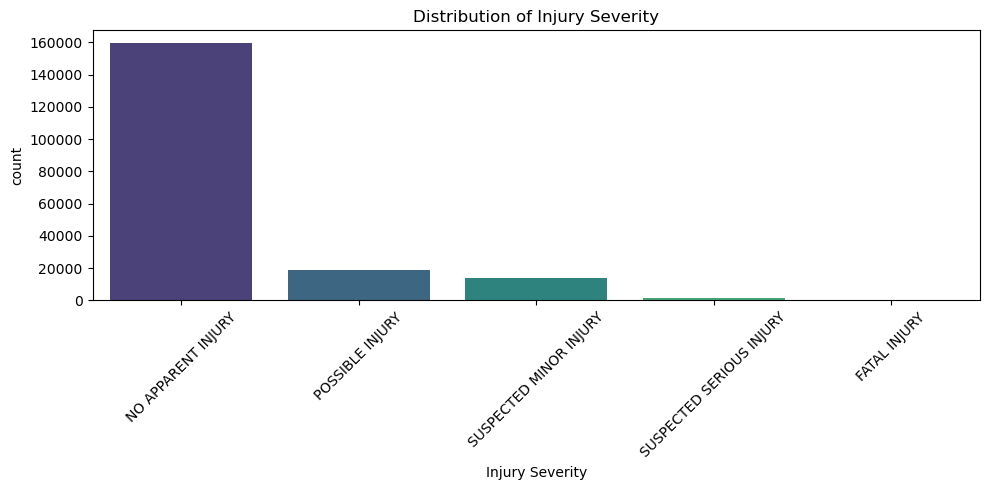

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Fix inconsistent case in column values
df['Injury Severity'] = df['Injury Severity'].str.upper().str.strip()

plt.figure(figsize=(10, 5))
sns.countplot(data=df, x='Injury Severity', palette='viridis', order=df['Injury Severity'].value_counts().index)
plt.title("Distribution of Injury Severity")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show();


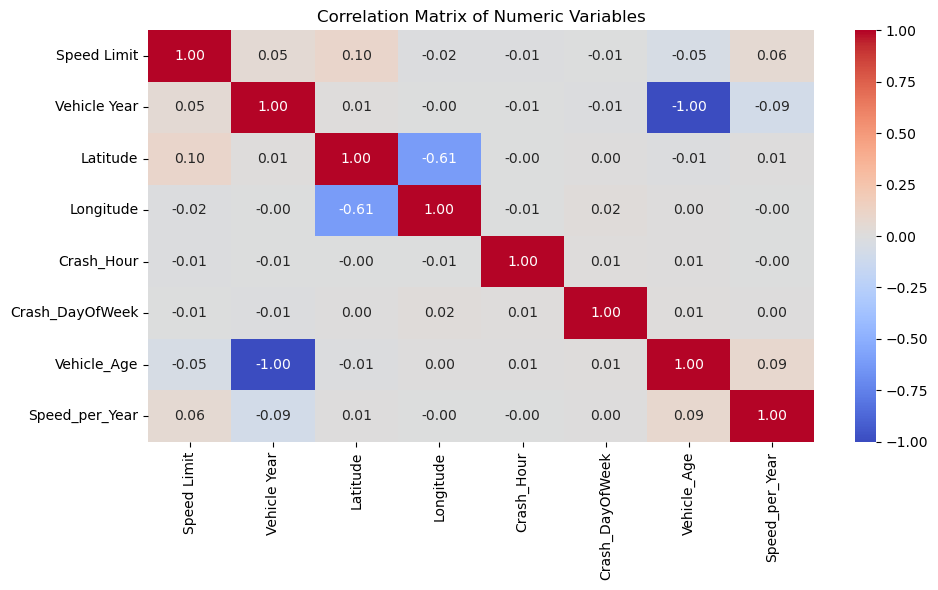

In [ ]:
numeric_cols = ['Speed Limit', 'Vehicle Year', 'Latitude', 'Longitude',
                'Crash_Hour', 'Crash_DayOfWeek', 'Vehicle_Age', 'Speed_per_Year']

plt.figure(figsize=(10, 6))
sns.heatmap(df_train[numeric_cols].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix of Numeric Variables")
plt.tight_layout()
plt.show()

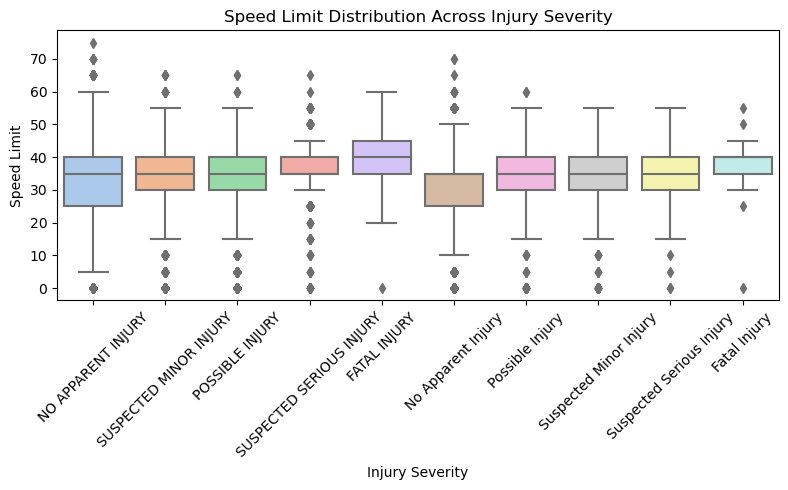

In [ ]:
plt.figure(figsize=(8, 5))
sns.boxplot(data=df_train, x='Injury Severity', y='Speed Limit', palette='pastel')
plt.title("Speed Limit Distribution Across Injury Severity")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

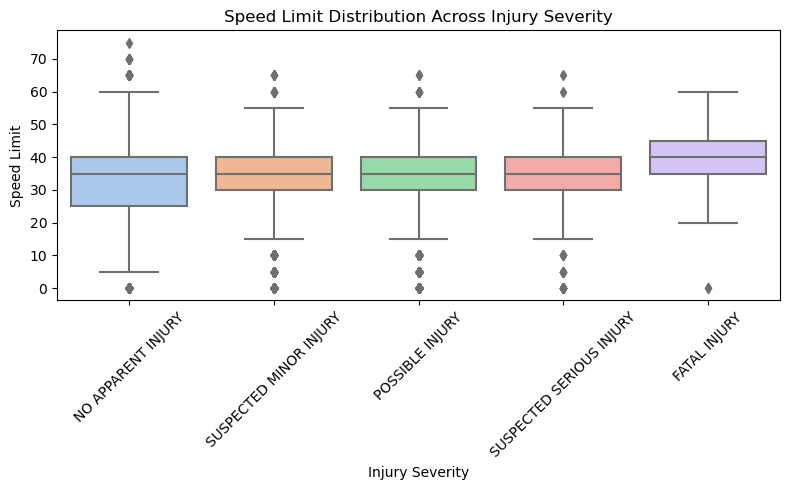

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 5))
sns.boxplot(data=df, x='Injury Severity', y='Speed Limit', palette='pastel')
plt.title("Speed Limit Distribution Across Injury Severity")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


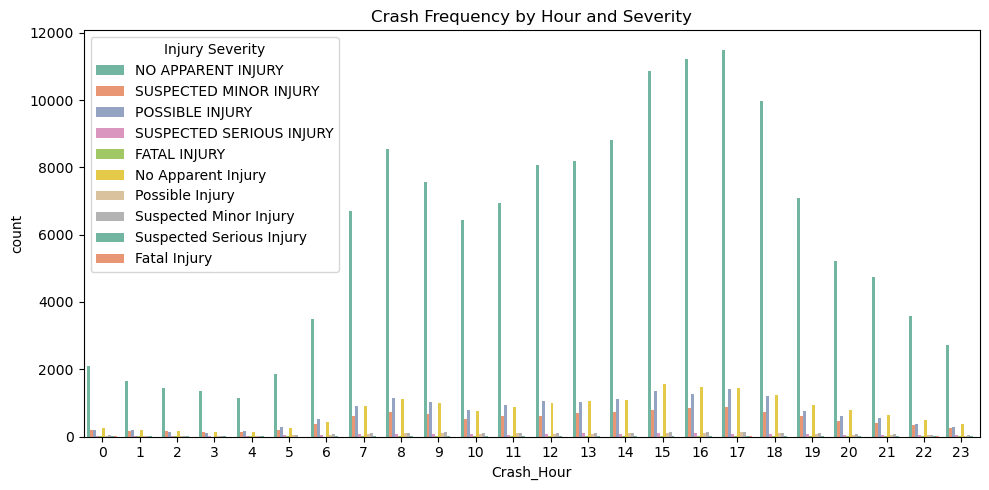

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(data=df_train, x='Crash_Hour', hue='Injury Severity', palette='Set2')
plt.title("Crash Frequency by Hour and Severity")
plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 5))
sns.countplot(data=df, x='Crash_Hour', hue='Injury Severity', palette='Set2')
plt.title("Crash Frequency by Hour and Severity")
plt.xlabel("Hour of Day (0–23)")
plt.ylabel("Number of Crashes")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


ValueError: Could not interpret input 'Crash_Hour'

<Figure size 1000x500 with 0 Axes>

In [ ]:
df['Crash Date/Time'] = pd.to_datetime(df['Crash Date/Time'], errors='coerce')
df['Crash_Hour'] = df['Crash Date/Time'].dt.hour


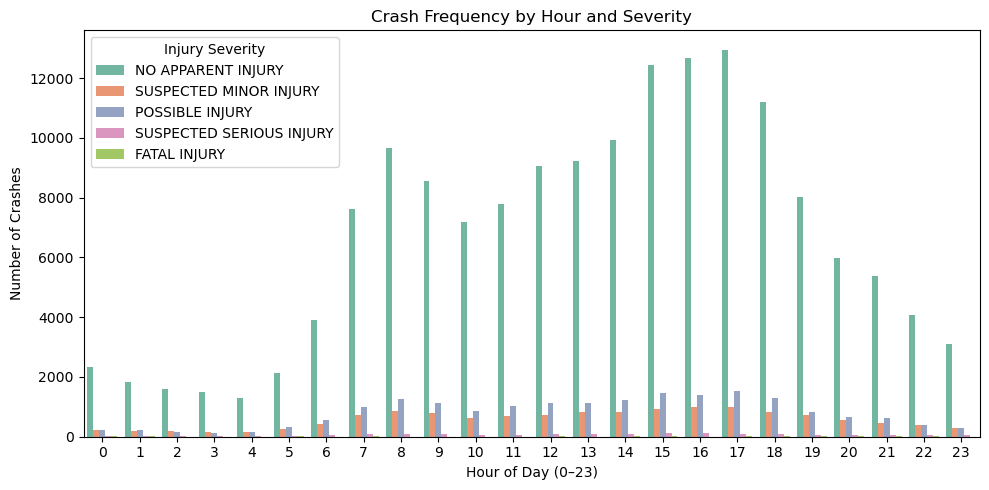

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(data=df, x='Crash_Hour', hue='Injury Severity', palette='Set2')
plt.title("Crash Frequency by Hour and Severity")
plt.xlabel("Hour of Day (0–23)")
plt.ylabel("Number of Crashes")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


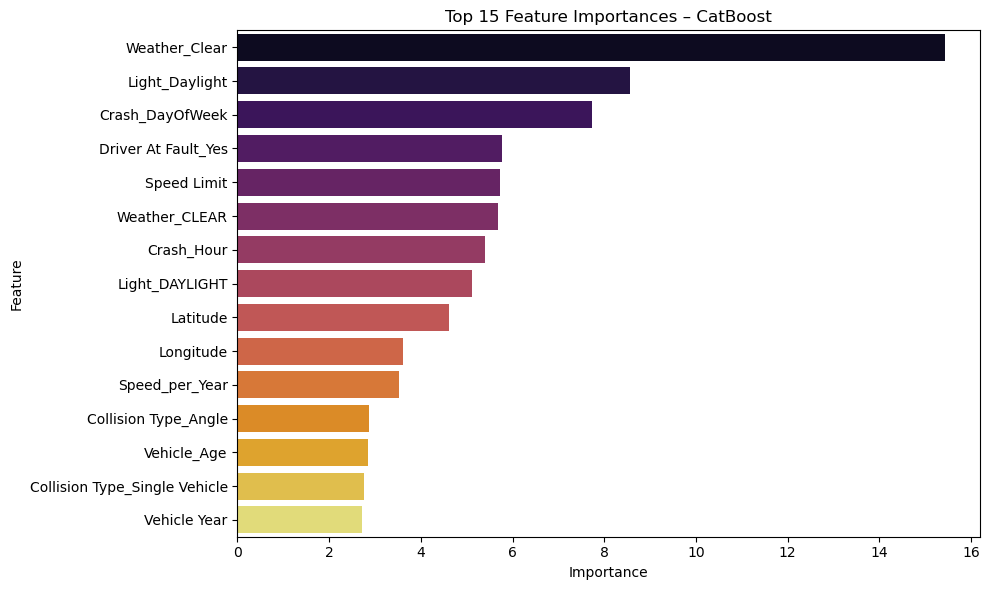

In [ ]:
importances = cat_model.get_feature_importance()
feature_names = X.columns
feat_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feat_df_sorted = feat_df.sort_values(by='Importance', ascending=False).head(15)

plt.figure(figsize=(10, 6))
sns.barplot(data=feat_df_sorted, x='Importance', y='Feature', palette='inferno')
plt.title("Top 15 Feature Importances – CatBoost")
plt.tight_layout()
plt.show()

In [ ]:
plt.figure(figsize=(8, 5))
ax = sns.countplot(data=df_train, x='Injury Severity', palette='viridis')
plt.title("Distribution of Injury Severity")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


NameError: name 'plt' is not defined

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 5))
ax = sns.countplot(data=df_train, x='Injury Severity', palette='viridis')
plt.title("Distribution of Injury Severity")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show();


NameError: name 'df_train' is not defined

<Figure size 800x500 with 0 Axes>

In [ ]:
# STEP 1: Import libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, classification_report
from imblearn.over_sampling import SMOTE
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from sklearn.neural_network import MLPClassifier

# STEP 2: Load and preprocess
df = pd.read_csv("C:/Users/hp/Downloads/Crash_Reporting_-_Drivers_Data.csv", usecols=[
    'Crash Date/Time', 'Injury Severity', 'Speed Limit', 'Vehicle Year',
    'Latitude', 'Longitude', 'Weather', 'Light', 'Collision Type', 'Driver At Fault'
])

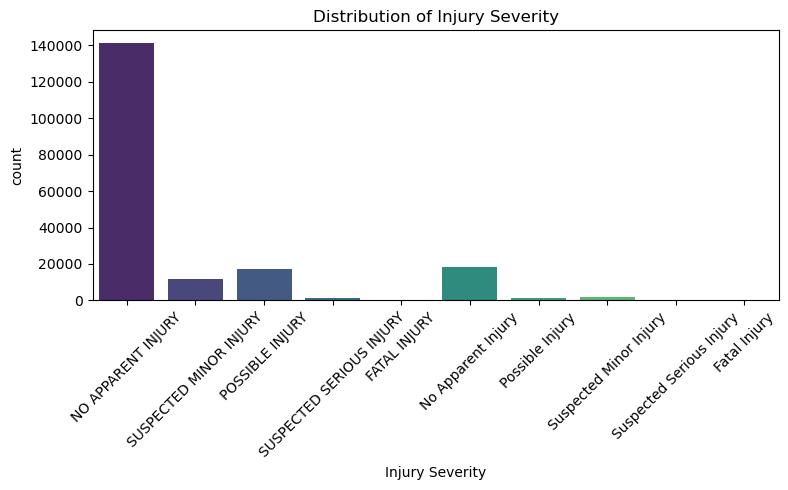

In [ ]:
plt.figure(figsize=(8, 5))
ax = sns.countplot(data=df, x='Injury Severity', palette='viridis')
plt.title("Distribution of Injury Severity")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show();


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 5))
ax = sns.countplot(data=df_train, x='Injury Severity', palette='viridis')
plt.title("Distribution of Injury Severity")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show();


NameError: name 'df_train' is not defined

<Figure size 800x500 with 0 Axes>